## Refine epithelial cell annotations for large intestine - relabelling uncertain cells based on majority voting

In [1]:
import scanpy as sc
import pandas as pd
import numpy as np
import sys
import os
from collections import Counter

import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import to_hex
import ast

In [2]:
sc.logging.print_header()

scanpy==1.7.1 anndata==0.8.0 umap==0.4.6 numpy==1.20.1 scipy==1.6.1 pandas==1.2.3 scikit-learn==0.24.1 statsmodels==0.12.2 python-igraph==0.8.3 louvain==0.7.0 leidenalg==0.8.3


In [3]:
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42

In [4]:
sc.set_figure_params(
    dpi=200,dpi_save=300,
    fontsize=12,
    frameon=False,
    transparent=True,
)

In [5]:
sns.set_style(style="white")
sns.set_context(context="paper")

In [6]:
adata = sc.read_h5ad('/nfs/team205/ao15/Megagut/Annotations_v3/h5ad/disease/compartments/Epi.pooled_disease_with_klennerman_ramnik.log1pcounts.20230221.h5ad')

In [7]:
adata

AnnData object with n_obs × n_vars = 311277 × 18485
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_counts_hb_sp

In [8]:
list(adata.obs.organ_unified.unique())

['ileum',
 'caecum',
 'rectum',
 'sigmoid colon',
 'colon',
 'ascending colon',
 'small intestine',
 'stomach',
 'descending colon',
 'transverse',
 'duodenum']

In [9]:
adata = adata[~adata.obs.organ_unified.isin(['ileum',
 
 'small intestine',
 'duodenum','stomach'])].copy()

In [10]:
adata

AnnData object with n_obs × n_vars = 116103 × 18485
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_counts_hb_sp

In [11]:
adata_scanvi = pd.read_csv('/nfs/team205/ao15/Megagut/Annotations_v3/metadata/X_scANVI/disease/disease_fine_annot_predict_Epi_LI_adult_method2_20230221_RAMNIK_KLENERMAN_POOLED_scANVIobsm.csv.gz',compression='gzip',index_col=0)

In [12]:
adata_scanvi

,LV1,LV2,LV3,LV4,LV5,LV6,LV7,LV8,LV9,LV10,LV11,LV12,LV13,LV14,LV15,LV16,LV17,LV18,LV19,LV20
index,,,,,,,,,,,,,,,,,,,,
AAACCTGGTCTTTCAT-scrEXT001,0.065063,0.724252,0.532578,0.155425,0.258733,0.026523,-0.077738,-0.935326,-1.340696,-0.135202,-0.040811,-0.024796,-0.259163,0.698904,-0.276099,-0.949262,0.031803,0.103551,0.036461,-1.044813
AAAGATGGTATAGGGC-scrEXT001,0.154588,-2.108576,0.280209,0.129227,0.306066,0.077100,0.006615,-1.240505,-0.149718,-0.044862,-0.099568,-0.109189,-0.457238,-0.699063,-0.372050,2.065342,-0.023132,0.199433,-0.047812,-1.383002
AAAGATGGTGGCCCTA-scrEXT001,0.056376,0.214129,-0.013501,-0.154597,-1.221245,0.073379,-0.004688,-0.412931,0.814335,-0.079035,0.012424,0.016587,-0.363864,-1.328290,-0.203558,1.420984,-0.133768,0.146219,0.109556,0.628151
AAAGCAAGTAAACACA-scrEXT001,0.097532,-1.828027,0.658432,-0.717948,0.120521,0.114009,-0.007134,-1.176004,-0.396808,-0.065709,-0.043744,-0.074637,-0.648605,-0.934625,-0.259891,1.360326,-0.082865,0.191588,0.002960,0.935122
AAAGCAAGTCATCCCT-scrEXT001,0.102058,0.028138,-0.318477,-0.850401,0.177137,0.113123,-0.073851,-2.546045,-1.715626,-0.182155,-0.085575,-0.130313,0.441536,0.285122,0.715005,-0.925990,0.005639,0.129117,0.042421,-0.525822
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
N130084_L-GTGGTTACAGTTCCAA-N130084_L,0.080163,-1.697329,0.532934,-1.315137,1.638868,0.078298,-0.059671,-1.082499,-0.213048,-0.156992,-0.076649,-0.199311,1.700725,2.611239,-1.415647,-0.401982,0.162676,0.119553,0.070581,-1.062000
N130084_L-TATCCTATCGTTCATT-N130084_L,0.029717,-0.653176,-0.696866,-1.318062,0.465558,0.042668,0.025961,-0.087542,-0.058524,-0.059883,0.002429,-0.031932,-0.271525,0.131003,0.694196,0.409602,0.027220,0.062472,0.018969,-0.317243
N130084_L-TCATCCGGTATGATCC-N130084_L,0.014982,-0.786605,1.561810,-0.613374,1.537899,-0.030664,0.007360,-0.113989,-0.518060,-0.038610,0.018819,-0.028353,-0.238676,-0.345852,-0.150165,0.273770,-0.009530,0.042612,0.008016,0.336016


In [13]:
adata.obsm['X_scANVI'] = adata_scanvi

In [14]:
adata_meta = pd.read_csv('/nfs/team205/ao15/Megagut/Annotations_v3/metadata/disease/20230308/scanvi/disease_fine_annot_predict_Epi_LI_adult_method2_20230221_RAMNIK_KLENERMAN_POOLED.csv',index_col=0)

/home/jovyan/my-conda-envs/standard/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3165: DtypeWarning: Columns (3,5,6,8,9,11,12,14,64,67,69,76,77,78,89,94,97,99,100,102,103,105,106,107,108,109,110,111,112,113) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


In [15]:
adata_meta

,latent_cell_probability,latent_RT_efficiency,cecilia22_predH,cecilia22_predH_prob,cecilia22_predH_uncertain,cecilia22_predL,cecilia22_predL_prob,cecilia22_predL_uncertain,elmentaite21_pred,elmentaite21_pred_prob,...,TX_steroid,TX_immunomodulators,TX_antibiotic,Smoking,batch,celltype,fine_annot,fine_predicted_labels,fine_predicted_labels_uncertainty,scanvi_pred
index,,,,,,,,,,,,,,,,,,,,,
AAACCTGGTCTTTCAT-scrEXT001,0.999873,2.794602,Epithelial cells,0.843226,Epithelial cells,Epithelial cells,0.949155,Epithelial cells,BEST2+ Goblet cell,0.968591,...,NaN,NaN,NaN,NaN,0,NaN,Unknown,Doublets,0.540008,TA_cycling
AAAGATGGTATAGGGC-scrEXT001,0.999923,3.364700,Epithelial cells,0.994449,Epithelial cells,Epithelial cells,0.998999,Epithelial cells,Goblet cell,0.247065,...,NaN,NaN,NaN,NaN,0,NaN,Unknown,Epithelial_stem,0.599964,Epithelial_stem
AAAGATGGTGGCCCTA-scrEXT001,0.999929,3.838964,Epithelial cells,0.999978,Epithelial cells,Epithelial cells,0.999997,Epithelial cells,Mesothelium,0.997397,...,NaN,NaN,NaN,NaN,0,NaN,Unknown,Doublets,0.140003,DSC_MUC17
AAAGCAAGTAAACACA-scrEXT001,0.999882,3.473178,Epithelial cells,0.221513,Uncertain,Epithelial cells,0.155091,Uncertain,Goblet cell,0.017632,...,NaN,NaN,NaN,NaN,0,NaN,Unknown,Doublets,0.580034,Epithelial_stem
AAAGCAAGTCATCCCT-scrEXT001,0.999743,1.723092,Epithelial cells,0.117101,Uncertain,Epithelial cells,0.268638,Uncertain,TA,0.154195,...,NaN,NaN,NaN,NaN,0,NaN,Unknown,TA_cycling,0.099997,TA_cycling
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
N130084_L-GTGGTTACAGTTCCAA-N130084_L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,no,no,no,Never,0,NaN,Unknown,Tuft,0.000000,Tuft
N130084_L-TATCCTATCGTTCATT-N130084_L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,no,no,no,Never,0,NaN,Unknown,Colonocyte,0.040048,Colonocyte
N130084_L-TCATCCGGTATGATCC-N130084_L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,no,no,no,Never,0,NaN,Unknown,BEST4,0.219959,BEST4


In [16]:
adata.obs = adata_meta

In [17]:
sc.pp.neighbors(adata, use_rep="X_scANVI")
sc.tl.umap(adata)

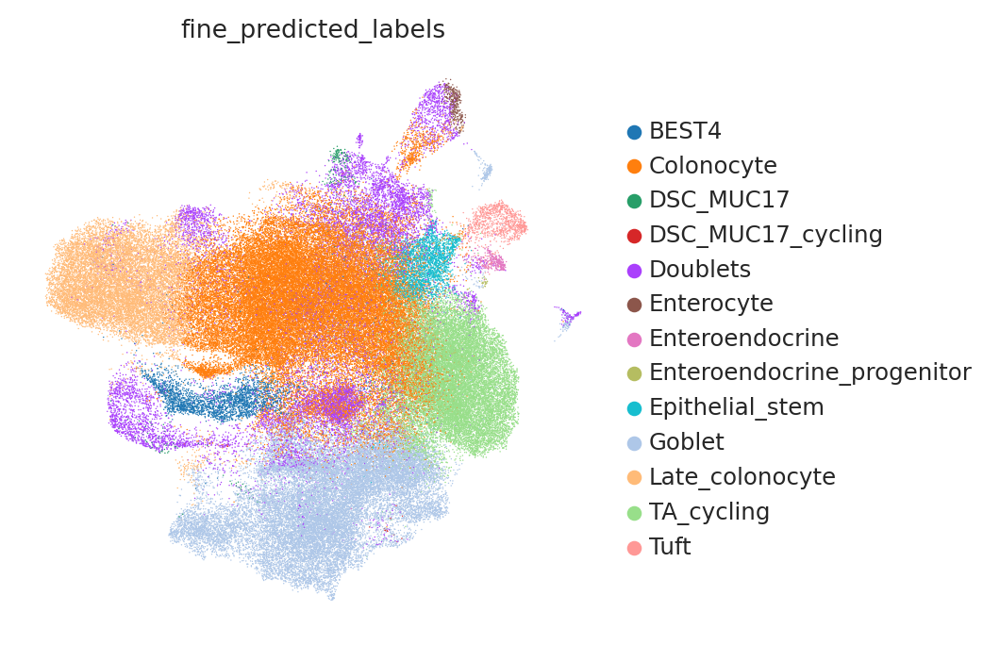

In [18]:
sc.pl.umap(adata, color=['fine_predicted_labels'])

In [19]:
adata.obs.donor_disease.unique()

['cancer', 'UC', 'PIBD', 'CD', 'control']
Categories (5, object): ['cancer', 'UC', 'PIBD', 'CD', 'control']

In [20]:
adata.obs['disease'] = adata.obs['donor_category'].astype(str) + '_' + adata.obs['donor_disease'].astype(str)

In [21]:
list(adata.obs.disease.unique())

['disease_cancer',
 'disease_UC',
 'disease_PIBD',
 'control_CD',
 'disease_CD',
 'control_control']

In [22]:
adata.obs['donor_disease'] = (adata.obs['disease'].map(lambda x:{
'control_control':'control',
 'control_CD':'CD',
 'disease_PIBD':'PIBD',
 'disease_cancer':'cancer_colorectal',
 'disease_CD':'CD',
'disease_UC':'UC'
    
    }.get(x,x)).astype("category"))

In [23]:
adata.obs.donor_disease.unique()

['cancer_colorectal', 'UC', 'PIBD', 'CD', 'control']
Categories (5, object): ['cancer_colorectal', 'UC', 'PIBD', 'CD', 'control']

In [24]:
adata.obs['disease'] = (adata.obs['disease'].map(lambda x:{
'disease_cancer':'cancer_colorectal',
 'disease_UC':'ulcerative_colitis',
 'disease_PIBD':'pediatric_IBD',
 'control_CD':'crohns_noninflammed',
 'disease_CD':'crohns_disease',
 'control_control':'control'
    }.get(x,x)).astype("category"))

In [25]:
list(adata.obs.disease.unique())

['cancer_colorectal',
 'ulcerative_colitis',
 'pediatric_IBD',
 'crohns_noninflammed',
 'crohns_disease',
 'control']

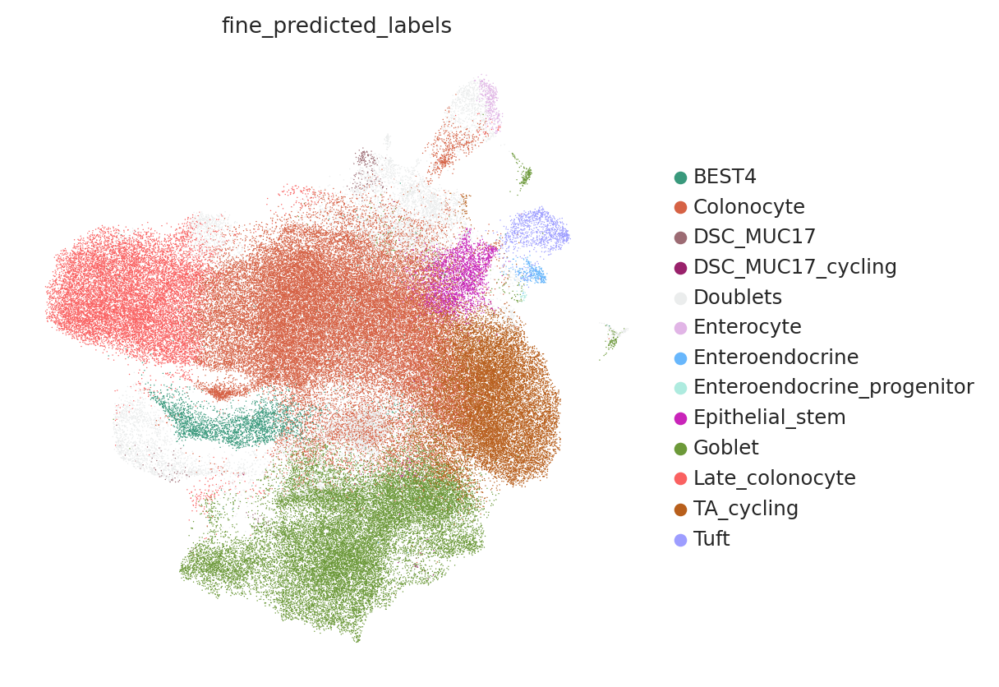

In [26]:
plt.rcParams['figure.figsize'] = [5,5]
sc.pl.umap(adata,color='fine_predicted_labels',palette = ['#39997c',#BEST4
                                                 
                                               '#d66245',#Colonocyte
                                               '#9c6b73',#DSC_MUC17
                                               '#99216b',#DSC_MUC17 cycling
                                                 '#ebeded',#doublets
                                               '#e1b5e6',#enterocyte
                                                '#68b7fc',#enteroendocrine
                                                 '#aeebdf',#enteroendocrine progenitor
                                                 
                                                
                                               '#c924b9',#stem
                                               '#6c9939',#goblet
                                               #'#d1d14f',#goblet_cycling
                                               #'#e9f7ad',#goblet progenitor
                                               
                                               '#fa6161',#late colonocyte
                                              #'#d9b74a',#MUC5AC
                                               #'#f7b37c',#MUC6
                                               
                                               #'#e55b85',#Microfold
                                               #'#79508f',#paneth
                                              #'#ad1a55',#TA
                                               '#b85f1c',#TA cycling
                                               '#9d9dff',#tuft
                                               
                                               
    
    
                                              ],save='Epi_LI_scanviannot_predicted.pdf')

In [27]:
adata.obs['organ_unified'].cat.categories

Index(['ascending colon', 'caecum', 'colon', 'descending colon', 'rectum',
       'sigmoid colon', 'transverse'],
      dtype='object')

In [28]:
adata.obs['organ_unified'].cat.reorder_categories(['caecum', 'ascending colon','transverse', 'descending colon', 'sigmoid colon', 'rectum','colon'], inplace=True)

In [29]:
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42
sc.set_figure_params(dpi=150,dpi_save=300)

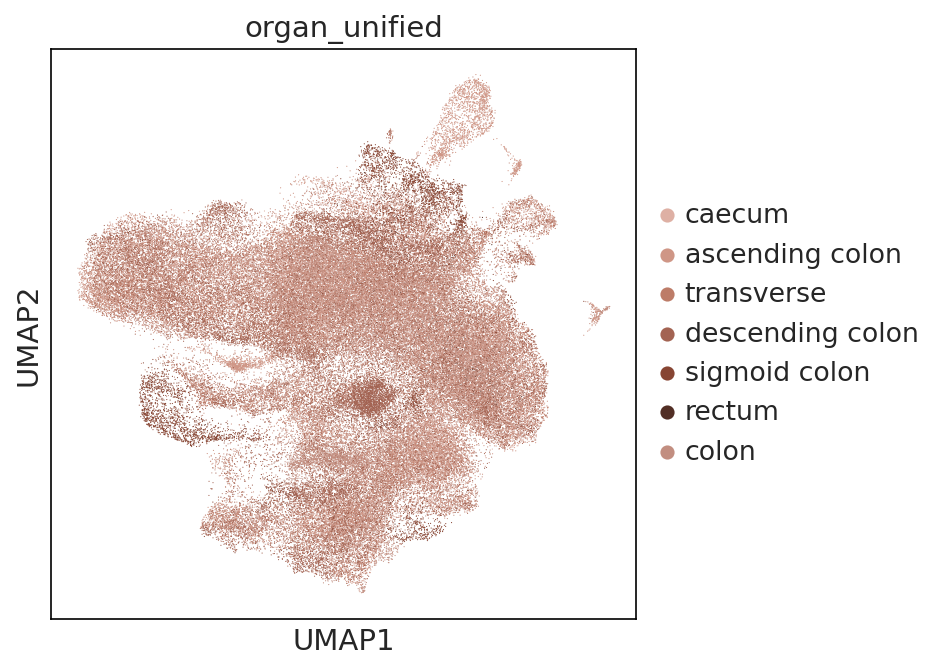

In [30]:
c_organs_unified = [
     
    '#deb0a4',#ceacum
     '#cf9686',#ascending colon
     '#bd7c68',#transverse
     '#a36352',#descending
     '#874533', #sigmoid
     '#522e25',#rectum
     '#c28e80',#colon
    ]
plt.rcParams['figure.figsize'] = [5,5]
sc.pl.umap(adata, color='organ_unified',palette=c_organs_unified,size=1.2)

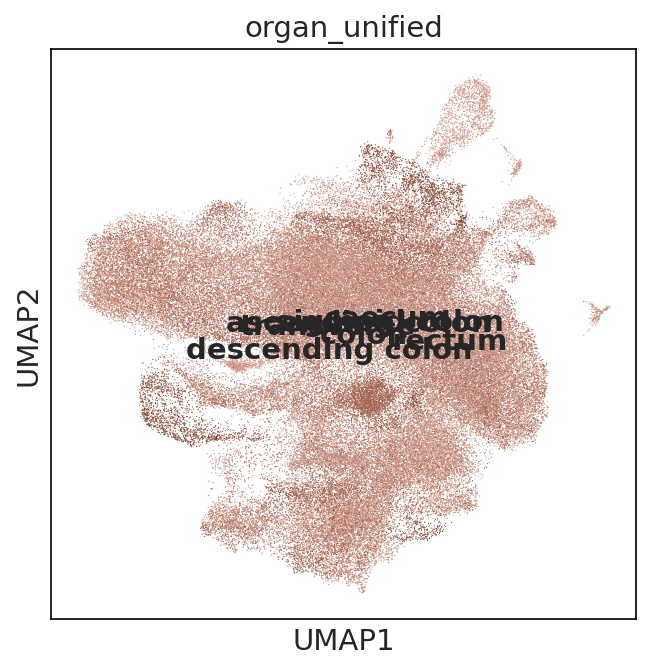

In [31]:
sc.pl.umap(adata, color='organ_unified',palette=c_organs_unified,size=1.2,legend_loc='on data')

In [32]:
adata

AnnData object with n_obs × n_vars = 116103 × 18485
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_counts_hb_sp

In [33]:
del adata.uns['organ_unified_colors']

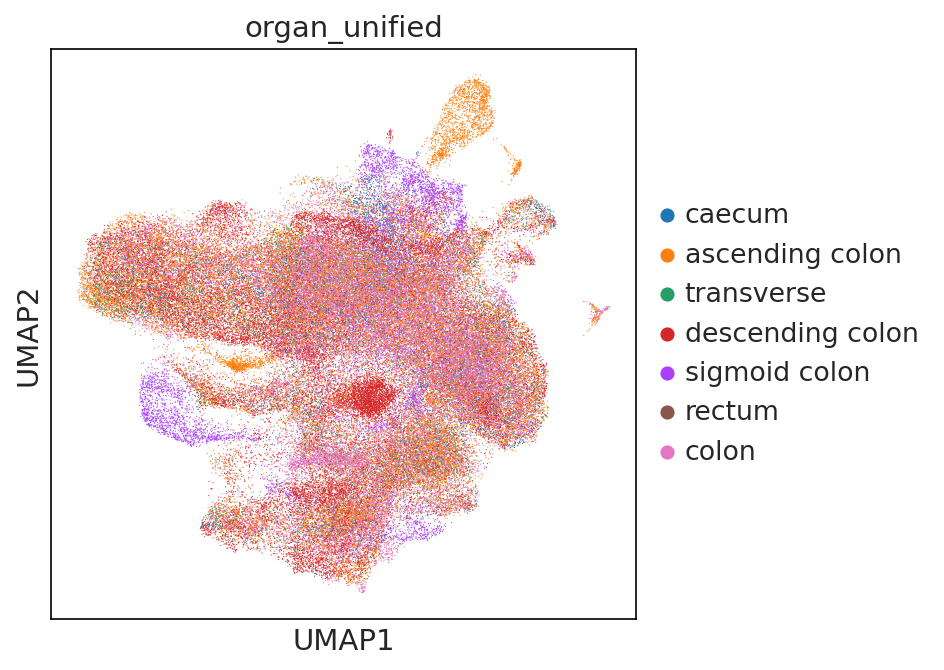

In [34]:
sc.pl.umap(adata, color='organ_unified',size=1.2)

In [35]:
adata.obs['disease'].cat.categories

Index(['cancer_colorectal', 'control', 'crohns_disease', 'crohns_noninflammed',
       'pediatric_IBD', 'ulcerative_colitis'],
      dtype='object')

In [36]:
adata.obs['disease'].cat.reorder_categories(['control', 'crohns_disease', 'crohns_noninflammed',
       'pediatric_IBD', 'ulcerative_colitis','cancer_colorectal',], inplace=True)

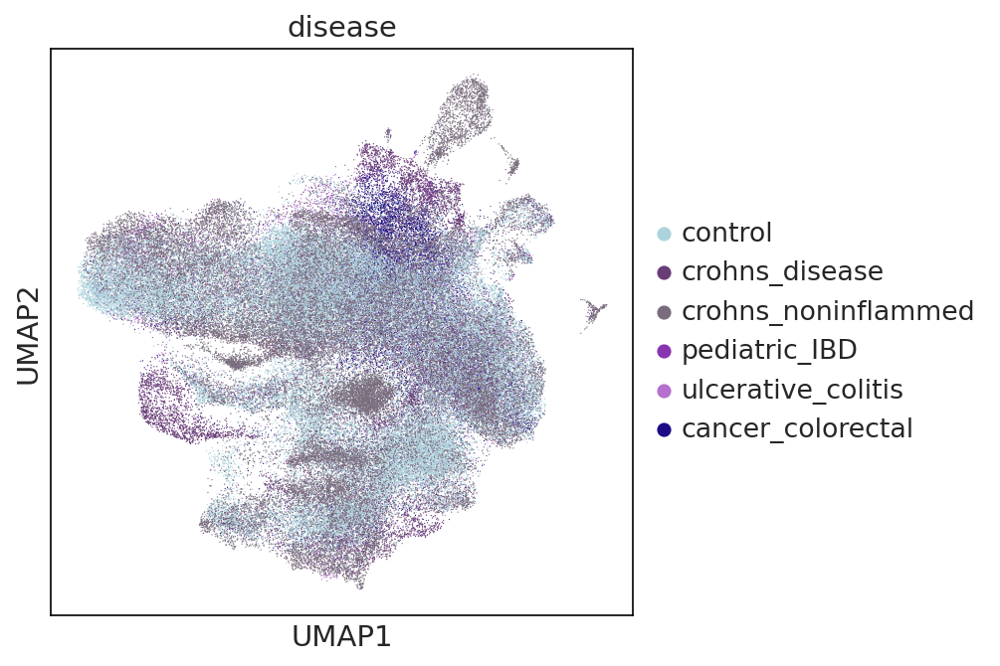

In [37]:
sc.pl.umap(adata,color = 'disease',palette=['#ADD3DD',#control
                                    '#693C78',#crohn's disease
                                            '#796d7d',#crohns noninflammed
                                            '#8934B1',#UC
                                            '#B670CD',#PIBD
                                            '#1C0B86',#colorectal cancer
                                            #'#38B257',#celiac_active
                                            #'#85C762',#celiac_inactive
                                           ],size=1.5,save='pooled_healthy_SI_disease.png')

In [38]:
adata.layers['counts'] = adata.X

In [39]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

In [40]:
marker_genes_dict = { 'BEST4':['BEST4','CA7','GUCA2B','CFTR'],
                     'Colonocyte':['CA1','GPT'],
                     
                     'DCS_MUC17':['MUC17','TFF1','CD55','TM4SF1','DUOX2','DUOXA2'],
                     'Cycling markers':['MKI67','PCNA','TOP2A'],
                        'Enterocyte':['FABP1','APOA4','PRAP1','PCK1','RBP2','SI'],
                     'Enteroendocrine':['CHGA','PCSK1N','SCT','SCGN','NEUROD1','SOX4'],
                     'Stem':['LGR5','RGMB','ASCL2','OLFM4'],
                     
                     
                     'Goblet':['MUC2','TFF3','FCGBP','ZG16'],
                     'Mature_colonocyte':['SLC26A3','AQP8','CEACAM7'],
                      #'MUC5AC':['MUC5AC','GKN2'],
                     #'MUC6':['MUC6','AQP5','BPIFB1','PGC'],
                    # 'Microfold':['IL2RG','ICAM2','CCL20','CCL23'],
                     'Paneth':['DEFA6','DEFA5','REG3A','PLA2G2A'],
                     
                     'Tuft':['SH2D6','LRMP','MATK','HPGDS']
                     }

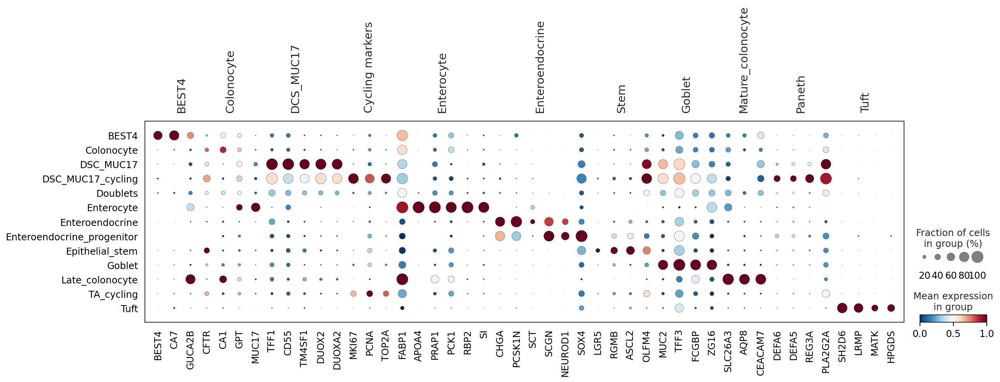

In [41]:
sc.pl.dotplot(adata,var_names=marker_genes_dict,groupby='fine_predicted_labels',color_map='RdBu_r', standard_scale='var')#,save='Epi_LI_disease_markers.pdf')

In [42]:
uncert = adata.obs[['fine_predicted_labels','fine_predicted_labels_uncertainty']] 

In [43]:
uncert

,fine_predicted_labels,fine_predicted_labels_uncertainty
index,,
AAACCTGGTCTTTCAT-scrEXT001,Doublets,0.540008
AAAGATGGTATAGGGC-scrEXT001,Epithelial_stem,0.599964
AAAGATGGTGGCCCTA-scrEXT001,Doublets,0.140003
AAAGCAAGTAAACACA-scrEXT001,Doublets,0.580034
AAAGCAAGTCATCCCT-scrEXT001,TA_cycling,0.099997
...,...,...
N130084_L-GTGGTTACAGTTCCAA-N130084_L,Tuft,0.000000
N130084_L-TATCCTATCGTTCATT-N130084_L,Colonocyte,0.040048
N130084_L-TCATCCGGTATGATCC-N130084_L,BEST4,0.219959


In [44]:
#calculate 90th percentile to use as cut off for uncertain cells
p = np.percentile(adata.obs['fine_predicted_labels_uncertainty'], 90) # return 90th percentile
print(p)

0.46001356934255966


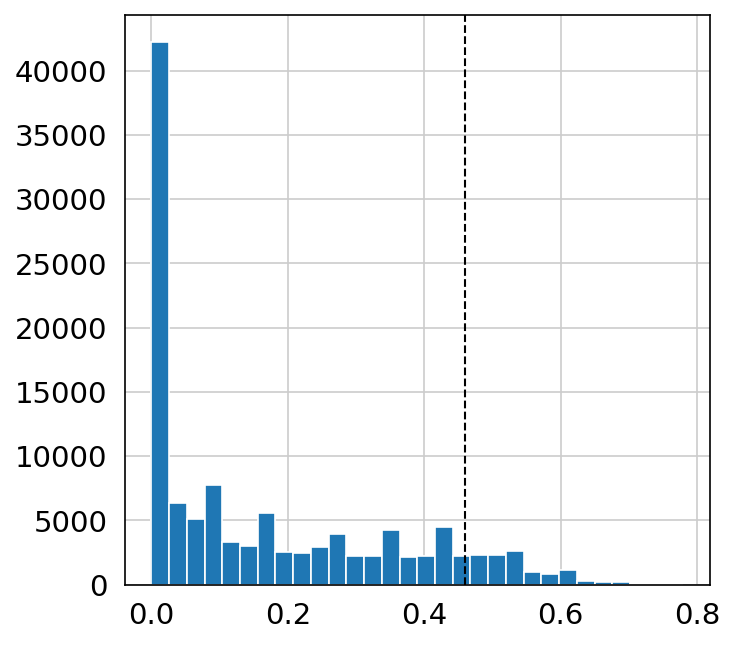

In [45]:
#plot uncertainty distribution
plt.hist(adata.obs['fine_predicted_labels_uncertainty'], bins=30)
plt.axvline(x=p, color='black', linestyle='dashed', linewidth=1)
plt.savefig('Epi_LI_scanviannot_uncertdist.pdf', format='pdf')
plt.show()

In [46]:
uncert['fine_predicted_labels'] = uncert['fine_predicted_labels'].cat.add_categories('Unknown')

<ipython-input-46-905f2ed234d6>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  uncert['fine_predicted_labels'] = uncert['fine_predicted_labels'].cat.add_categories('Unknown')


#### make a different cut off for cancer vs noncancer

In [47]:
adata.obs['disease'].unique()

['cancer_colorectal', 'ulcerative_colitis', 'pediatric_IBD', 'crohns_noninflammed', 'crohns_disease', 'control']
Categories (6, object): ['cancer_colorectal', 'ulcerative_colitis', 'pediatric_IBD', 'crohns_noninflammed', 'crohns_disease', 'control']

In [48]:
cancer = adata[adata.obs['disease'].isin(['cancer_colorectal'])].copy()

In [49]:
noncancer = adata[~adata.obs['disease'].isin(['cancer_colorectal'])].copy()

In [50]:
#calculate 90th percentile to use as cut off for uncertain cells
p = np.percentile(cancer.obs['fine_predicted_labels_uncertainty'], 90) # return 90th percentile
print(p)

0.5200127722334565


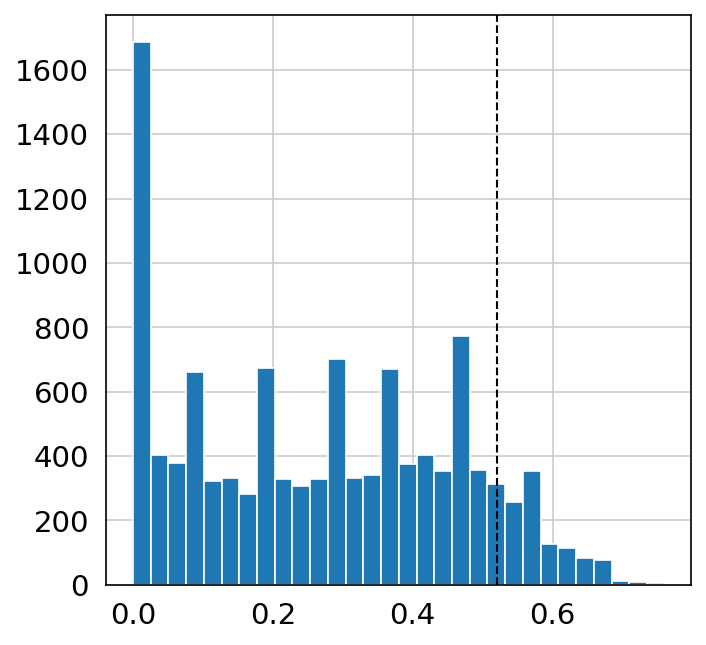

In [51]:
#plot uncertainty distribution
plt.hist(cancer.obs['fine_predicted_labels_uncertainty'], bins=30)
plt.axvline(x=p, color='black', linestyle='dashed', linewidth=1)
plt.savefig('Epi_LI_histogram_uncert_cellsfromcancer.pdf', dpi=300)

In [52]:
#calculate 90th percentile to use as cut off for uncertain cells
p = np.percentile(noncancer.obs['fine_predicted_labels_uncertainty'], 90) # return 90th percentile
print(p)

0.4599415282007799


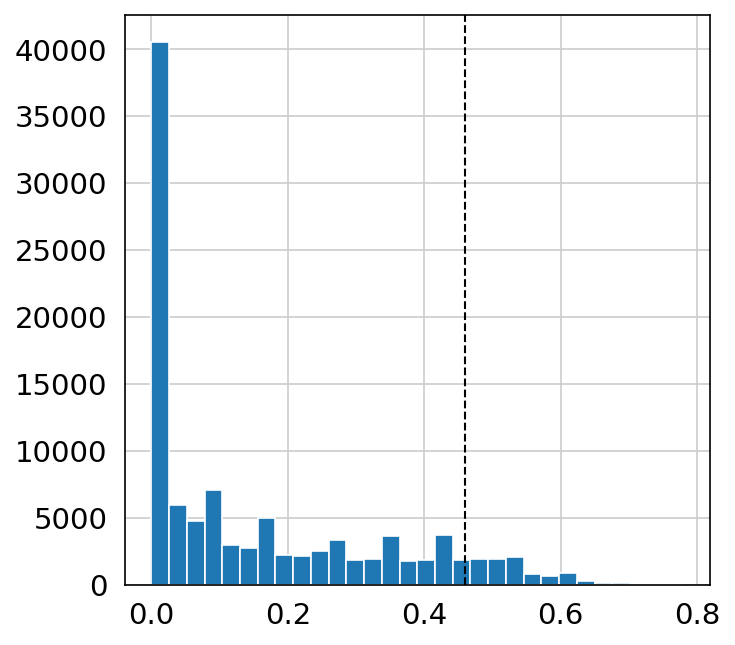

In [53]:
#plot uncertainty distribution
plt.hist(noncancer.obs['fine_predicted_labels_uncertainty'], bins=30)
plt.axvline(x=p, color='black', linestyle='dashed', linewidth=1)
plt.savefig('Epi_LI_histogram_uncert_notcancer.pdf', dpi=300)

In [54]:
uncert_cancer = cancer.obs[['fine_predicted_labels','fine_predicted_labels_uncertainty']]
uncert_other = noncancer.obs[['fine_predicted_labels','fine_predicted_labels_uncertainty']]

In [55]:
uncert_cancer['fine_predicted_labels'] = uncert_cancer['fine_predicted_labels'].cat.add_categories('Unknown')

<ipython-input-55-fe174e31fe34>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  uncert_cancer['fine_predicted_labels'] = uncert_cancer['fine_predicted_labels'].cat.add_categories('Unknown')


In [56]:
uncert_other['fine_predicted_labels'] = uncert_other['fine_predicted_labels'].cat.add_categories('Unknown')

<ipython-input-56-71865c2852cd>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  uncert_other['fine_predicted_labels'] = uncert_other['fine_predicted_labels'].cat.add_categories('Unknown')


In [57]:
#mark cells are unknown based on cut off of 90th percentile rounded to the nearest second decimal
uncert_cancer.loc[uncert_cancer["fine_predicted_labels_uncertainty"] > 0.52, "fine_predicted_labels"] = "Unknown"

/home/jovyan/my-conda-envs/standard/lib/python3.8/site-packages/pandas/core/indexing.py:1720: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)


In [58]:
#mark cells are unknown based on cut off of 90th percentile rounded to the nearest second decimal
uncert_other.loc[uncert_other["fine_predicted_labels_uncertainty"] > 0.46, "fine_predicted_labels"] = "Unknown"

/home/jovyan/my-conda-envs/standard/lib/python3.8/site-packages/pandas/core/indexing.py:1720: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)


In [59]:
uncert_cancer['fine_predicted_labels'].value_counts()

Colonocyte           4294
Doublets             2332
TA_cycling           2072
Unknown              1180
Goblet                614
Late_colonocyte       476
Epithelial_stem       279
BEST4                  56
Tuft                   29
DSC_MUC17              26
DSC_MUC17_cycling       2
Enteroendocrine         2
Name: fine_predicted_labels, dtype: int64

In [60]:
uncert_other['fine_predicted_labels'].value_counts()

Colonocyte                    33343
Goblet                        21001
TA_cycling                    13521
Late_colonocyte               12027
Unknown                        9702
Doublets                       9216
BEST4                          2443
Epithelial_stem                1802
Tuft                            910
Enterocyte                      299
Enteroendocrine                 285
DSC_MUC17                       169
Enteroendocrine_progenitor       17
DSC_MUC17_cycling                 6
Name: fine_predicted_labels, dtype: int64

In [61]:
adata.obs['fine_predicted_labels_uncertflagged'] = adata.obs['fine_predicted_labels']

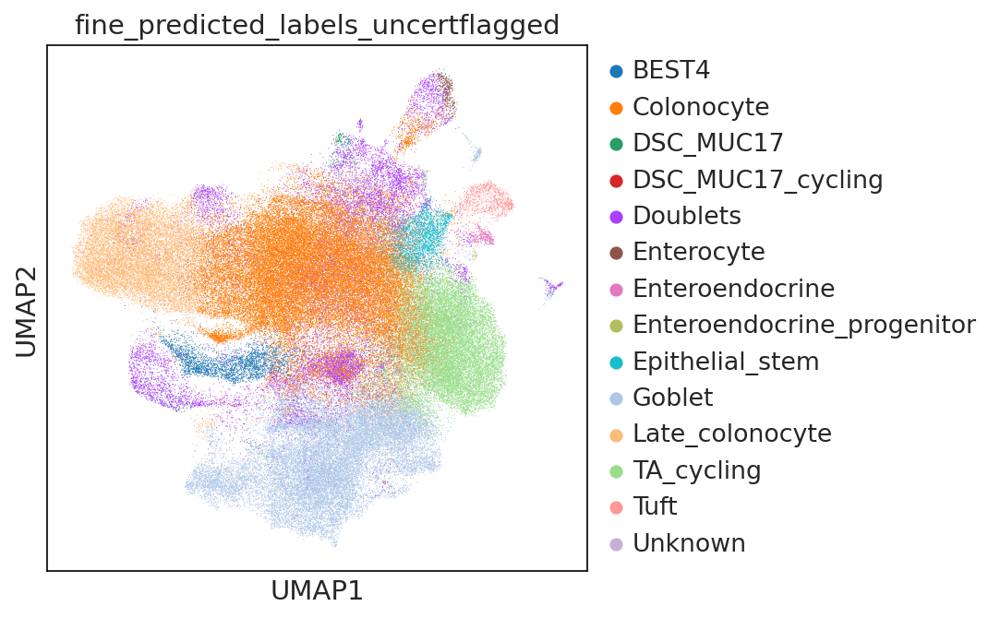

In [62]:
ON = {O:N for O,N in zip(uncert_cancer.index,uncert_cancer["fine_predicted_labels"])}
adata.obs["fine_predicted_labels_uncertflagged"] = [ON[O] if O in ON else N for O,N in zip(adata.obs_names, adata.obs["fine_predicted_labels_uncertflagged"])]
sc.pl.umap(adata,color='fine_predicted_labels_uncertflagged')

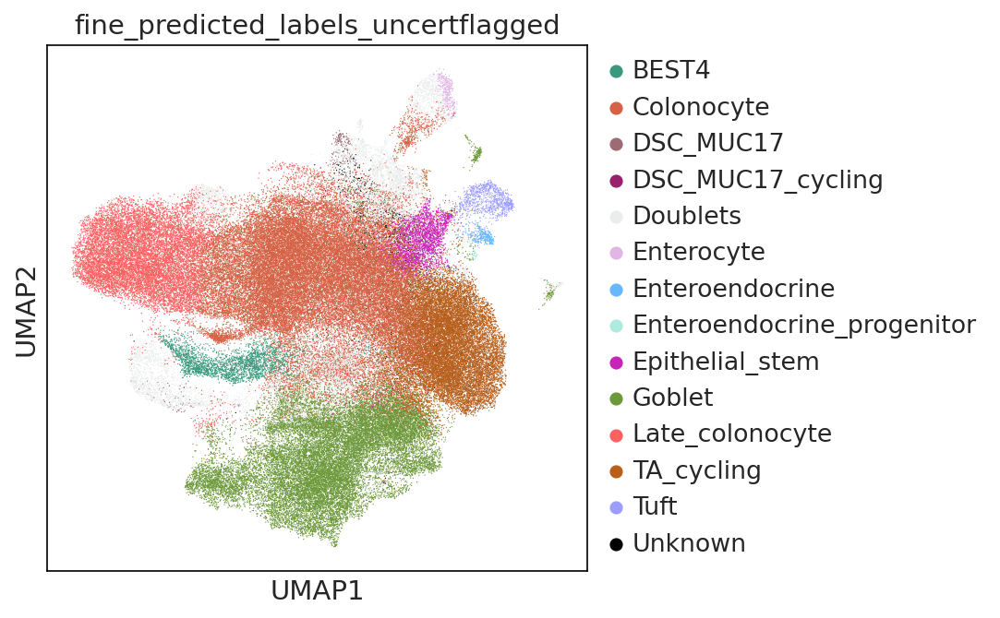

In [63]:
plt.rcParams['figure.figsize'] = [5,5]
sc.pl.umap(adata,color='fine_predicted_labels_uncertflagged',palette = ['#39997c',#BEST4
                                                 
                                               '#d66245',#Colonocyte
                                               '#9c6b73',#DSC_MUC17
                                               '#99216b',#DSC_MUC17 cycling
                                                 '#ebeded',#doublets
                                               '#e1b5e6',#enterocyte
                                                '#68b7fc',#enteroendocrine
                                                 '#aeebdf',#enteroendocrine progenitor
                                                 
                                                
                                               '#c924b9',#stem
                                               '#6c9939',#goblet
                                               #'#d1d14f',#goblet_cycling
                                               #'#e9f7ad',#goblet progenitor
                                               
                                               '#fa6161',#late colonocyte
                                              #'#d9b74a',#MUC5AC
                                               #'#f7b37c',#MUC6
                                               
                                               #'#e55b85',#Microfold
                                               #'#79508f',#paneth
                                              #'#ad1a55',#TA
                                               '#b85f1c',#TA cycling
                                               '#9d9dff',#tuft
                                                          '#000000',#unknown
                                               
                                               
    
    
                                              ],size=1.5,save='Epi_LI_disease_UMAP_uncertflagged.png')

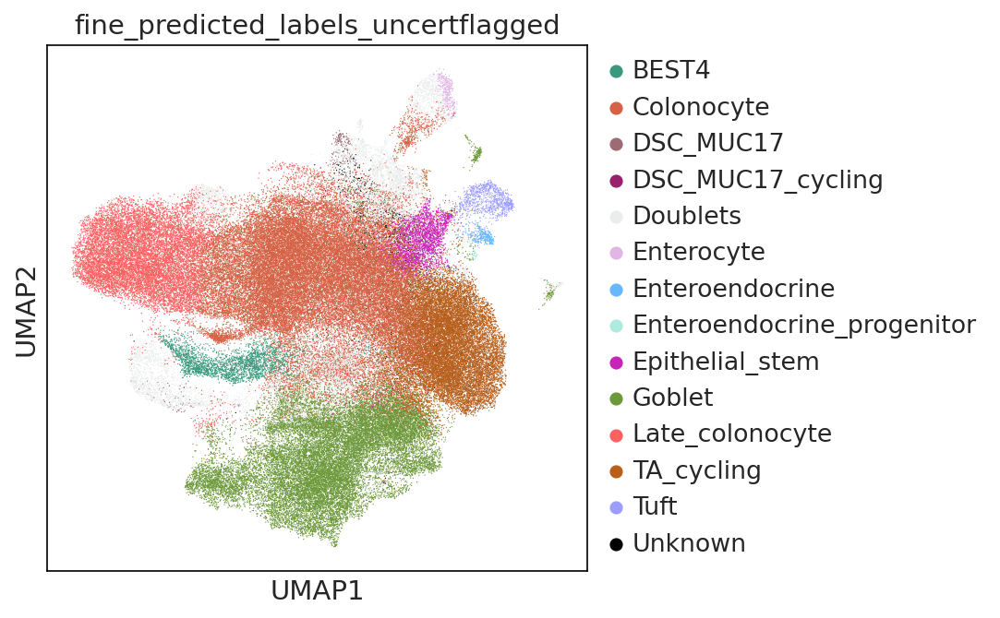

In [64]:
plt.rcParams['figure.figsize'] = [5,5]
sc.pl.umap(adata,color='fine_predicted_labels_uncertflagged',palette = ['#39997c',#BEST4
                                                 
                                               '#d66245',#Colonocyte
                                               '#9c6b73',#DSC_MUC17
                                               '#99216b',#DSC_MUC17 cycling
                                                 '#ebeded',#doublets
                                               '#e1b5e6',#enterocyte
                                                '#68b7fc',#enteroendocrine
                                                 '#aeebdf',#enteroendocrine progenitor
                                                 
                                                
                                               '#c924b9',#stem
                                               '#6c9939',#goblet
                                               #'#d1d14f',#goblet_cycling
                                               #'#e9f7ad',#goblet progenitor
                                               
                                               '#fa6161',#late colonocyte
                                              #'#d9b74a',#MUC5AC
                                               #'#f7b37c',#MUC6
                                               
                                               #'#e55b85',#Microfold
                                               #'#79508f',#paneth
                                              #'#ad1a55',#TA
                                               '#b85f1c',#TA cycling
                                               '#9d9dff',#tuft
                                                          '#000000',#unknown
                                               
                                               
    
    
                                              ],size=1.5,save='Epi_LI_disease_UMAP_uncertflagged.pdf')

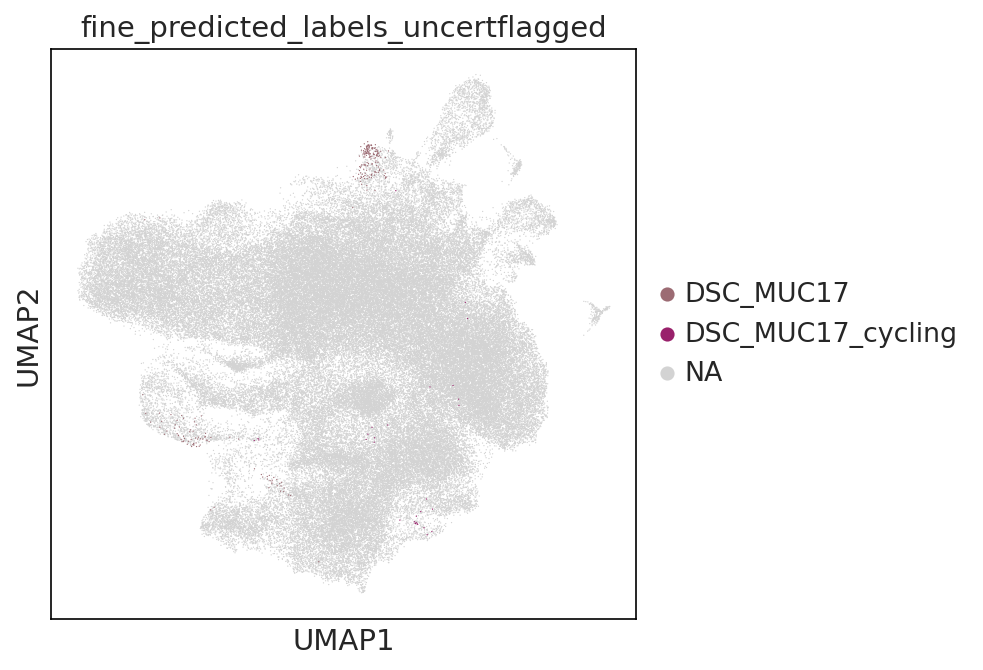

In [65]:
plt.rcParams['figure.figsize'] = [5,5]
sc.pl.umap(adata,color='fine_predicted_labels_uncertflagged',groups=['DSC_MUC17','DSC_MUC17_cycling'],size=1.5)

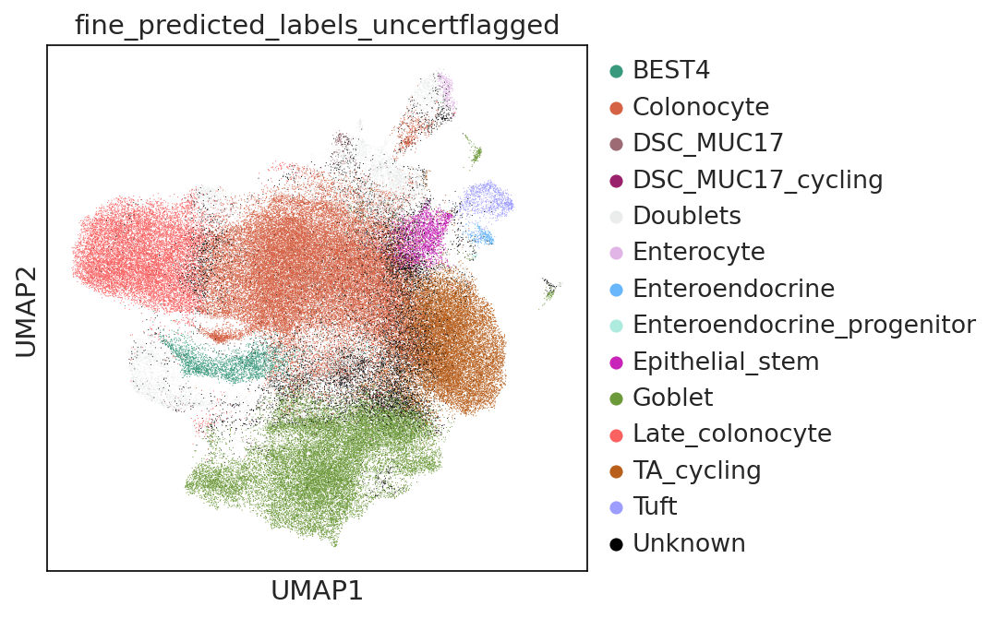

In [66]:
ON = {O:N for O,N in zip(uncert_other.index,uncert_other["fine_predicted_labels"])}
adata.obs["fine_predicted_labels_uncertflagged"] = [ON[O] if O in ON else N for O,N in zip(adata.obs_names, adata.obs["fine_predicted_labels_uncertflagged"])]
sc.pl.umap(adata,color='fine_predicted_labels_uncertflagged',save='Epi_LI_disease_UMAP_uncertflagged.pdf')

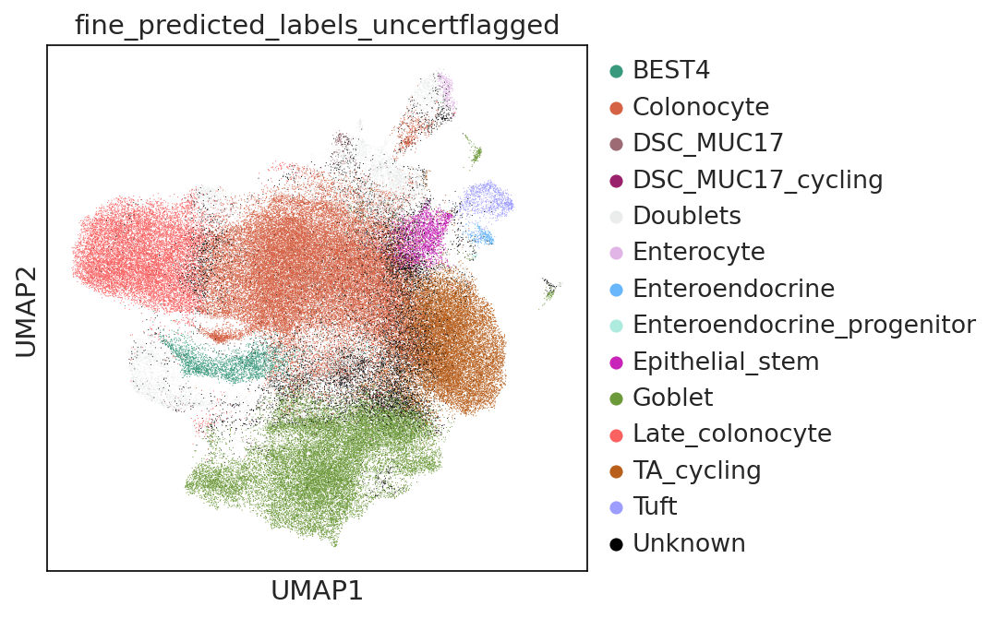

In [67]:
sc.pl.umap(adata,color='fine_predicted_labels_uncertflagged',save='Epi_LI_disease_UMAP_uncertflagged.png')

In [68]:
adata

AnnData object with n_obs × n_vars = 116103 × 18485
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_counts_hb_sp

In [69]:
adata.obs.fine_predicted_labels_uncertainty

index
AAACCTGGTCTTTCAT-scrEXT001              0.540008
AAAGATGGTATAGGGC-scrEXT001              0.599964
AAAGATGGTGGCCCTA-scrEXT001              0.140003
AAAGCAAGTAAACACA-scrEXT001              0.580034
AAAGCAAGTCATCCCT-scrEXT001              0.099997
                                          ...   
N130084_L-GTGGTTACAGTTCCAA-N130084_L    0.000000
N130084_L-TATCCTATCGTTCATT-N130084_L    0.040048
N130084_L-TCATCCGGTATGATCC-N130084_L    0.219959
N130084_L-GGTCACGGTTAGCGGA-N130084_L    0.319973
N130084_L-TGGTGATAGTTGGAAT-N130084_L    0.220038
Name: fine_predicted_labels_uncertainty, Length: 116103, dtype: float64

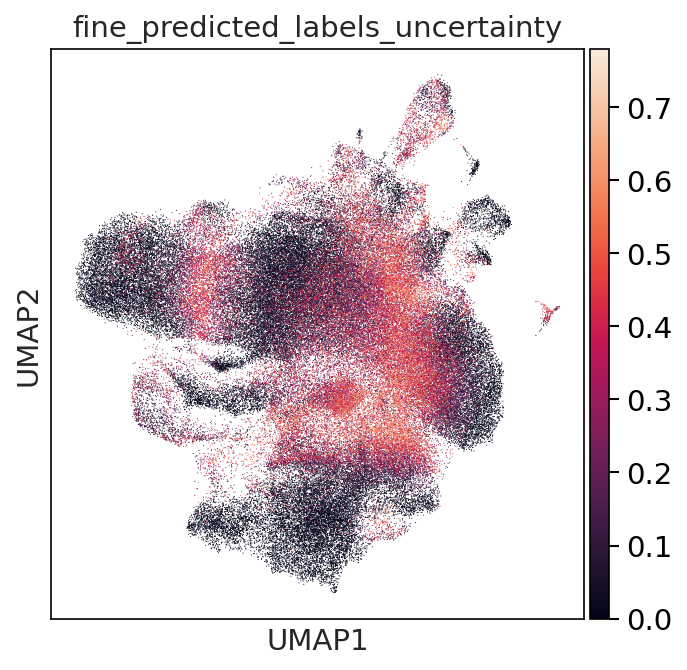

In [70]:
sc.pl.umap(adata,color='fine_predicted_labels_uncertainty',save='Epi_LI_scanviannot_uncertainty.pdf')

In [71]:
annot = pd.read_csv('/nfs/team205/ao15/Megagut/Annotations_v3/disease_annot/final_annot_post_scanvi/Epi_LI_disease_metadata_update20230706.csv',index_col=0)

/home/jovyan/my-conda-envs/standard/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3165: DtypeWarning: Columns (3,5,6,8,9,11,12,14,64,67,69,76,77,78,89,94,97,99,100,102,103,105,106,107,108,109,110,111,112,113) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


In [72]:
annot

,latent_cell_probability,latent_RT_efficiency,cecilia22_predH,cecilia22_predH_prob,cecilia22_predH_uncertain,cecilia22_predL,cecilia22_predL_prob,cecilia22_predL_uncertain,elmentaite21_pred,elmentaite21_pred_prob,...,batch,celltype,fine_annot,fine_predicted_labels,fine_predicted_labels_uncertainty,scanvi_pred,disease,fine_predicted_labels_uncertflagged,leiden1,fine_predicted_labels_resolved
index,,,,,,,,,,,,,,,,,,,,,
AAACCTGGTCTTTCAT-scrEXT001,0.999873,2.794602,Epithelial cells,0.843226,Epithelial cells,Epithelial cells,0.949155,Epithelial cells,BEST2+ Goblet cell,0.968591,...,0,NaN,Unknown,Doublets,0.540008,TA_cycling,cancer_colorectal,Unknown,4,Goblet
AAAGATGGTATAGGGC-scrEXT001,0.999923,3.364700,Epithelial cells,0.994449,Epithelial cells,Epithelial cells,0.998999,Epithelial cells,Goblet cell,0.247065,...,0,NaN,Unknown,Epithelial_stem,0.599964,Epithelial_stem,cancer_colorectal,Unknown,8,Doublets
AAAGATGGTGGCCCTA-scrEXT001,0.999929,3.838964,Epithelial cells,0.999978,Epithelial cells,Epithelial cells,0.999997,Epithelial cells,Mesothelium,0.997397,...,0,NaN,Unknown,Doublets,0.140003,DSC_MUC17,cancer_colorectal,Doublets,8,Doublets
AAAGCAAGTAAACACA-scrEXT001,0.999882,3.473178,Epithelial cells,0.221513,Uncertain,Epithelial cells,0.155091,Uncertain,Goblet cell,0.017632,...,0,NaN,Unknown,Doublets,0.580034,Epithelial_stem,cancer_colorectal,Unknown,6,Colonocyte
AAAGCAAGTCATCCCT-scrEXT001,0.999743,1.723092,Epithelial cells,0.117101,Uncertain,Epithelial cells,0.268638,Uncertain,TA,0.154195,...,0,NaN,Unknown,TA_cycling,0.099997,TA_cycling,cancer_colorectal,TA_cycling,6,TA_cycling
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
N130084_L-GTGGTTACAGTTCCAA-N130084_L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,NaN,Unknown,Tuft,0.000000,Tuft,crohns_noninflammed,Tuft,20,Tuft
N130084_L-TATCCTATCGTTCATT-N130084_L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,NaN,Unknown,Colonocyte,0.040048,Colonocyte,crohns_noninflammed,Colonocyte,2,Colonocyte
N130084_L-TCATCCGGTATGATCC-N130084_L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,NaN,Unknown,BEST4,0.219959,BEST4,crohns_noninflammed,BEST4,12,BEST4


In [73]:
adata.obs['fine_predicted_labels_resolved'] = annot.fine_predicted_labels_resolved

In [74]:
adata

AnnData object with n_obs × n_vars = 116103 × 18485
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_counts_hb_sp

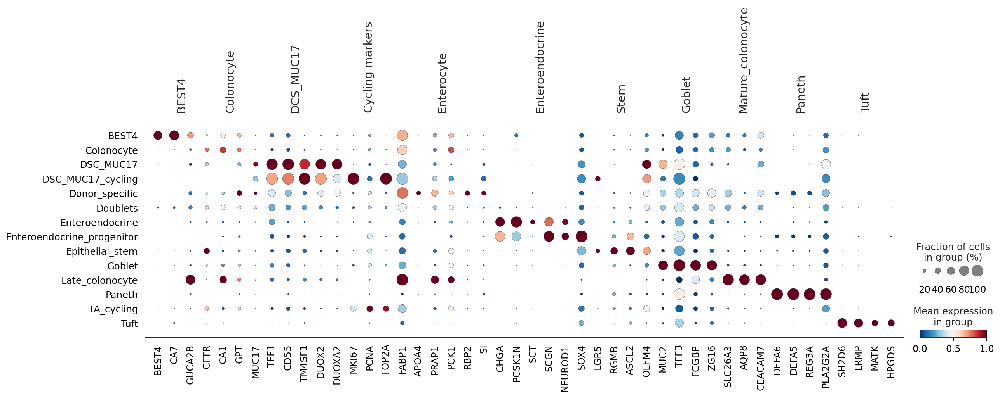

In [75]:
sc.pl.dotplot(adata,var_names=marker_genes_dict,groupby='fine_predicted_labels_resolved',color_map='RdBu_r', standard_scale='var',save='Epi_LI_scanviannot_resvoledmarkers.pdf')

In [76]:
colors={
    'Doublets':'#ebeded',
    'EC_venous': '#2a4858',
  'Mast': '#826e91',
  'EC_capillary': '#855f9a',
  'DC_cDC1': '#8c543f',
  'Monocyte': '#5baf07',
  'DC_cDC2': '#cfdb65',
  'Basal': '#727271',
  'Treg_IL10': '#e5c510',
  'Crypt_fibroblast_PI16': '#bd7879',
  'Macrophage': '#486626',
  'Vascular_smooth_muscle': '#1E4147',
  'Lamina_propria_fibroblast_ADAMDEC1': '#e95e50',
  'Epithelial_cycling_G2M': '#ff3c4b',
  'Keratinocyte_stratified': '#EDD3E0',
  'Trm/em_CD8': '#256b87',
  'Pericyte': '#437356',
  'Oral_mucosa_fibroblast': '#303267',
  'Macrophage_MMP9': '#a5f002',
  'EC_lymphatic': '#999999',
  'Rectum_fibroblast': '#522e25',
  'Trm_Th17': '#1e093f',
  'DC_migratory': '#e6a519',
  'Epithelial_cycling_S': '#ff8433',
  'Trm_CD4': '#8107ed',
  'NK_CD16': '#0c1e0e',
  'Macrophage_LYVE1': '#8fd9d0',
  'Trm_CD8': '#2844c1',
  'Macrophage_TREM2': '#42c7ac',
  'Keratinocyte_inflammatory': '#E0AC9D',
  'Tnaive/cm_CD4': '#9c53bc',
  'DC_pDC': '#bdb197',
  'Villus_fibroblast_F3': '#d64582',
  'EC_arterial_2': '#ca6092',
  'EC_arterial_1': '#fa6e6e',
  'gdT': '#3fafb5',
  'B_memory': '#a33c22',
  'T/NK_cycling': '#c260ff',
  'Immune_recruiting_pericyte': '#AAC789',
  'MAIT': '#21b796',
  'ILC3': '#778c00',
  'Melanocyte': '#886F61',
  'Tfh_naive': '#5e3c55',
  'Keratinocyte_outer': '#BF7A9C',
  'EC_cycling': '#fac06e',
  'Tnaive/cm_CD8': '#5ca4ce',
  'NK_CD56bright': '#3f8c08',
  'B_naive': '#9b0319',
  'B_preB': '#8a4682',
  'Treg': '#f98261',
  'B_proB': '#d34794',
  'B_plasmablast': '#9e53db',
  'B_plasma_IgG': '#632f17',
  'Megakaryocyte/platelet': '#c730aa',
  'TA_cycling': '#b85f1c',
  'Mono/neutrophil_MPO': '#2a497a',
  'B_plasma_IgA1': '#f76c56',
  'Macrophage_CD5L': '#caf9cf',
  'Tfh': '#5e0b30',
  'Oesophagus_fibroblast': '#63A0C0',
  'B_plasma_IgA2': '#d6558d',
  'gdT_naive': '#26daf2',
  'B_GC_I': '#db9602',
  'B_plasma_IgM': '#c66d31',
  'DC_langerhans': '#c7a642',
  'Fibroblast_reticular': '#f0c134',
  'B_GC_II': '#e2d138',
  'Follicular_DC': '#f0982c',
  'Microfold': '#e55b85',
  'Enterocyte': '#e1b5e6',
  'Epithelial_stem': '#c924b9',
  'MUC5AC': '#d9b74a',
  'MUC6': '#f7b37c',
  'Cycling': '#ff8433',
  'Pareital': '#d45f80',
  'Enteroendocrine_MX': '#292663',
  'Myofibroblast': '#CCAE91',
  'Glial_2': '#0D6986',
  'Enteric_neural_crest_cycling': '#DBA507',
  'Enterochromaffin': '#22517a',
  'Chief': '#c95340',
  'Glial/Enteric_neural_crest': '#a8c545',
  'Enteroendocrine_G': '#2f3f4d',
  'Neuroblast': '#c50637',
  'Goblet_progenitor': '#e9f7ad',
  'Goblet': '#6c9939',
  'Enteroendocrine': '#68b7fc',
  'Erythrocytes': '#0e539c',
  'Enteroendocrine_X': '#7292ad',
  'Glial_3': '#053240',
  'Goblet_cycling': '#d1d14f',
  'BEST4': '#39997c',
  'Tuft': '#9d9dff',
  'Paneth': '#79508f',
  'Serous': '#C9DE55',
  'Mucous': '#67cc8e',
  'Duct': '#7D9100',
  'Seromucous': '#ACEBAE',
  'Myoepithelial': '#572300',
  'Ionocytes': '#9d9dff',
  'Colonocyte': '#d66245',
  'Late_colonocyte': '#fa6161',
  'Mesoderm_2': '#b4793b',
  'Branch_A_inhibtory_motor_neuron': '#a39bcb',
  'SMC_PPLP2': '#d4d4e8',
  'Cycling_fibroblast': '#d65151',
  'ICC': '#69479b',
  'Branch_B_excitatory_motor_neuron': '#496695',
  'SMC_CAPN3': '#968dc6',
  'Mesoderm_1': '#663818',
  'Branch_B_primary_afferent_neuron': '#909134',
  'Proximal_progenitor_DUO/JEJ': '#fac219',
  'SMC_CAPN3_cycling': '#76738e',
  'Glial_1': '#8EC7D2',
  'Branch_A_primary_afferent_neuron': '#27bdbf',
  'Branch_A_interneuron': '#67608a',
  'NTS': '#baada4',
  'Proximal_progenitor_ILE': '#8f6e0d',
  'Enteroendocrine_progenitor': '#aeebdf',
  'Mesothelium': '#8F6592',
  'Distal_progenitor': '#dbc697',
  'Angiogenic_pericyte': '#308587',
  'Eosinophil/basophil': '#8b4eba',
  'CLDN10': '#706d65',
  'Distal_progenitor_PRAC1': '#8f8161',
  'Immature_pericyte': '#90c496',
  'Mesenchymal_LTO': '#f7eb59',
  'Gastric_fetal_epithelial': '#a01160',
  'DSC_MUC17_cycling': '#99216b',
  'DSC_MUC17': '#9c6b73',
  'Gland_basal': '#404040',
  'Gland_fetal': '#168039',
  'Basal_cycling': '#d1bf82',
  'Keratinocyte_fetal': '#d8306e',
  'Gland_duct': '#7D9100',
  'Gland_mucous': '#67cc8e',
  'Myoblast/myocyte': '#e2798d',
  'Unknown': '#000000',
'Donor_specific':'#40372a'}

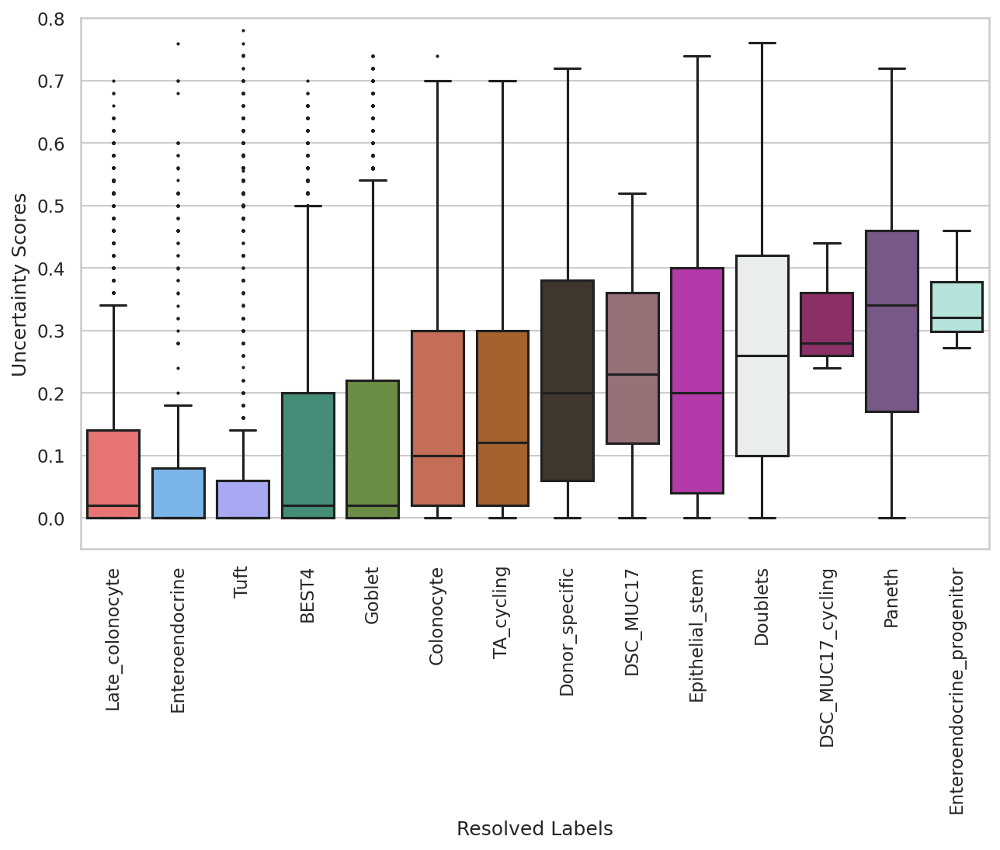

In [77]:
import matplotlib.pyplot as plt
import seaborn as sns  # Optional, but seaborn can enhance the style

# Assuming adata is your AnnData object

# Combine the two variables into a DataFrame for easier plotting
data_to_plot = adata.obs[['fine_predicted_labels_uncertainty', 'fine_predicted_labels_resolved']]

# Use seaborn for better styling (optional)
sns.set(style="whitegrid")

mean_uncertainty = data_to_plot.groupby('fine_predicted_labels_resolved')['fine_predicted_labels_uncertainty'].mean()

# Sort the categories based on mean uncertainty
sorted_categories = mean_uncertainty.sort_values().index

# Create a box and whisker plot
plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
ax = sns.boxplot(x='fine_predicted_labels_resolved', y='fine_predicted_labels_uncertainty', data=data_to_plot,palette=colors,order=sorted_categories,flierprops=dict(marker='o', markerfacecolor='gray', markersize=1))

# Add labels and title
plt.xticks(rotation=90)
plt.xlabel('Resolved Labels')
plt.ylabel('Uncertainty Scores')
ax.set_ylim(-0.05, 0.8)

# Save the plot as a PDF file
plt.savefig('Epi_LI_boxplot_uncertainty_scores.pdf', format='pdf')

# Show the plot
plt.show()

In [78]:
#related to revisions point 2.10 "Have you done differential gene expression analysis of the unknonw cells versus the annotated cells in their cluster?"

In [79]:
adata

AnnData object with n_obs × n_vars = 116103 × 18485
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_counts_hb_sp

In [80]:
adata.obs.fine_predicted_labels_resolved.value_counts()

Colonocyte                    39078
Goblet                        23885
TA_cycling                    16534
Late_colonocyte               13119
Doublets                      11230
Donor_specific                 5238
BEST4                          2793
Epithelial_stem                2471
Tuft                           1086
Enteroendocrine                 318
Paneth                          191
DSC_MUC17                       140
Enteroendocrine_progenitor       17
DSC_MUC17_cycling                 3
Name: fine_predicted_labels_resolved, dtype: int64

In [81]:
adata = adata[~adata.obs.fine_predicted_labels_resolved.isin(['Donor_specific'])].copy()

In [82]:
adata.obs.fine_predicted_labels_resolved.value_counts()

Colonocyte                    39078
Goblet                        23885
TA_cycling                    16534
Late_colonocyte               13119
Doublets                      11230
BEST4                          2793
Epithelial_stem                2471
Tuft                           1086
Enteroendocrine                 318
Paneth                          191
DSC_MUC17                       140
Enteroendocrine_progenitor       17
DSC_MUC17_cycling                 3
Name: fine_predicted_labels_resolved, dtype: int64

In [83]:
adata.obs['unknown_clusterlabel'] = adata.obs['fine_predicted_labels_uncertflagged'].astype(str) + '_' + adata.obs['fine_predicted_labels_resolved'].astype(str)

In [84]:
adata.obs['unknown_clusterlabel'].value_counts()

Colonocyte_Colonocyte                                    36620
Goblet_Goblet                                            20981
TA_cycling_TA_cycling                                    15371
Late_colonocyte_Late_colonocyte                          12417
Doublets_Doublets                                         9309
Unknown_Goblet                                            2904
BEST4_BEST4                                               2499
Unknown_Colonocyte                                        2458
Epithelial_stem_Epithelial_stem                           2081
Unknown_Doublets                                          1921
Unknown_TA_cycling                                        1163
Tuft_Tuft                                                  939
Unknown_Late_colonocyte                                    702
Unknown_Epithelial_stem                                    390
Unknown_BEST4                                              294
Enteroendocrine_Enteroendocrine                        

In [85]:
adata.X.max()

8.933079

         Falling back to preprocessing with `sc.pp.pca` and default params.


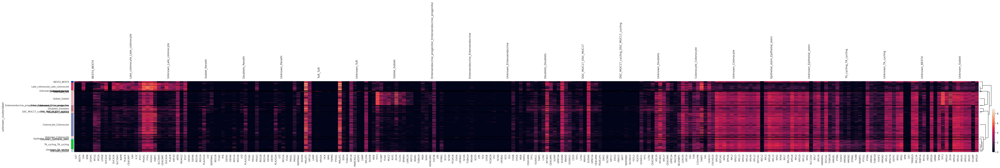

In [86]:
sc.tl.rank_genes_groups(adata, 'unknown_clusterlabel', method='wilcoxon')
sc.pl.rank_genes_groups_heatmap(adata, show_gene_labels=True)

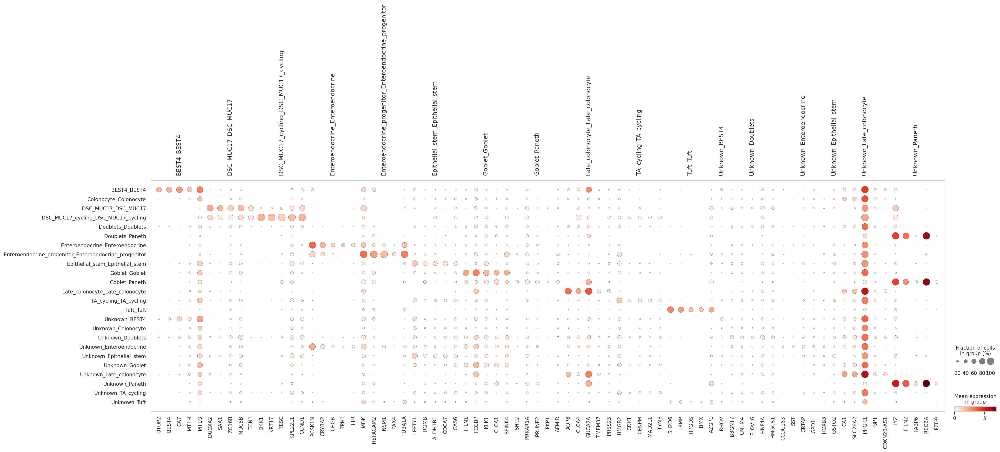

In [87]:
import sys
sys.path.append("/home/jovyan/ao15/Megagut/")
from re5_combine import *
adata.raw = adata.copy()
mkst = calc_marker_stats(adata, groupby="unknown_clusterlabel")
mks = filter_marker_stats(mkst[2], min_frac_diff=0.1, min_mean_diff=0.1, max_next_frac=0.5, max_next_mean=0.95, strict=False, how='or')
plot_markers(adata, groupby='unknown_clusterlabel', mks=mks)

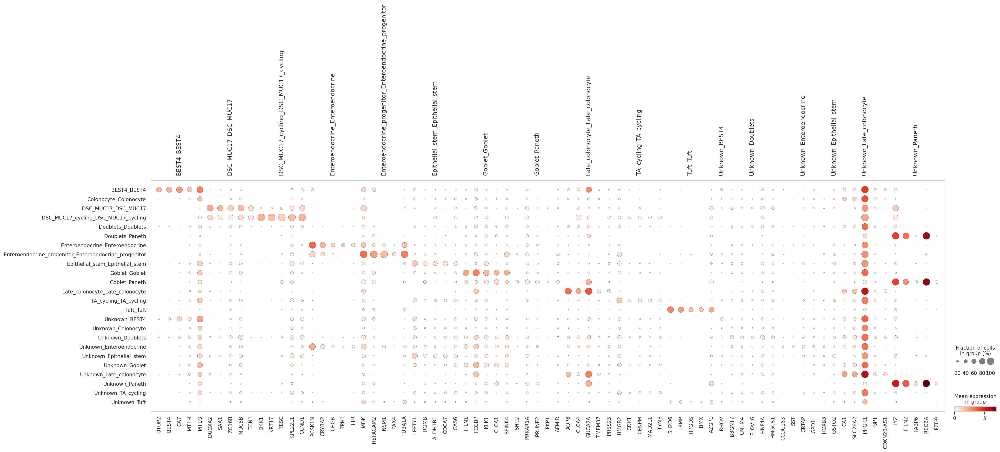

In [88]:
plot_markers(adata, groupby='unknown_clusterlabel', mks=mks,save='Epi_LI_unknown_specificDGE.pdf')